<a href="https://colab.research.google.com/github/Sescallupe/IAC_2022/blob/main/Ejemplo_PCL_PE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

texto en cursiva## **PCL-PE**

METHODOLOGY BASED ON AUTOMATIC LEARNING TO DETERMINE RISK AREAS IN RIVER BASINS

# **INSTALAMOS LAS APIS** 

---

1.   **gdal:** GDAL es una biblioteca de traducción para formatos de datos geoespaciales vectoriales y ráster que se publica bajo una licencia de código abierto estilo X / MIT por la Open Source Geospatial Foundation.(https://gdal.org/, https://howtoinstall.co/es/gdal-bin)
2.   **rasterio:** Los sistemas de información geográfica utilizan GeoTIFF y otros formatos para organizar y almacenar datasets ráster en cuadrícula, como imágenes de satélite y modelos de terreno. Rasterio lee y escribe estos formatos y proporciona una API de Python basada en matrices Numpy N-dimensional y GeoJSON.(https://rasterio.readthedocs.io/en/latest/)
3.   **rtree:** Rtree es una envoltura ctypes Python de libspatialindex que proporciona una serie de funciones avanzadas de indexación espacial para el usuario de Python con curiosidad espacial. Estas características incluyen la búsqueda de vecino más cercano, Búsqueda de intersección, índices multidimensionales, índices agrupados (almacena encurtidos de Python directamente con entradas de índice), carga a granel, supresión, serialización de disco, implementación de almacenamiento personalizado (para implementar la indexación espacial en ZODB, por ejemplo).(https://rtree.readthedocs.io/en/latest/)
4.   **geopandas:** GeoPandas depende, para su funcionalidad espacial, de una gran pila de bibliotecas geoespaciales de código abierto ( GEOS , GDAL , PROJ ). Instalamos la última versión de desarrollo directamente desde el repositorio de GitHub con:   
`!pip install git+git://github.com/geopandas/geopandas.git`
(https://geopandas.org/en/stable/getting_started/install.html)
5.   **descartes:** Utilice objetos geométricos como trazados y parches de matplotlib. https://pypi.org/project/descartes/
6.   **earthpy:** EarthPy es un paquete de Python que facilita el trazado y el trabajo con datos vectoriales y ráster espaciales mediante herramientas de código abierto. Earthpy depende de geopandas que se centra en datos vectoriales y rasterio que facilita la entrada y salida de archivos de datos ráster. También requiere matplotlib para trazar operaciones. El objetivo de EarthPy es facilitar el trabajo con datos espaciales para los científicos. Las contribuciones a EarthPy son bienvenidas.https://earthpy.readthedocs.io/en/latest/











In [ ]:
#@title <font color=#FF7F00> Click to run </font>  { display-mode: "form" }


!apt install gdal-bin python-gdal python3-gdal 
!pip install rasterio
!apt install python3-rtree 
!pip install git+git://github.com/geopandas/geopandas.git
!pip install descartes
!pip install --upgrade earthpy

Reading package lists... Done
Building dependency tree       
Reading state information... Done
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
python3-gdal is already the newest version (2.2.3+dfsg-2).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
python3-rtree is already the newest version (0.8.3+ds-1).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.
  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-crb1k5cw
  Running command git clone -q git://github.com/geopandas/geopandas.git /tmp/pip-req-build-crb1k5cw


# **METODOLOGÍA**

La metodología a seguir para el código
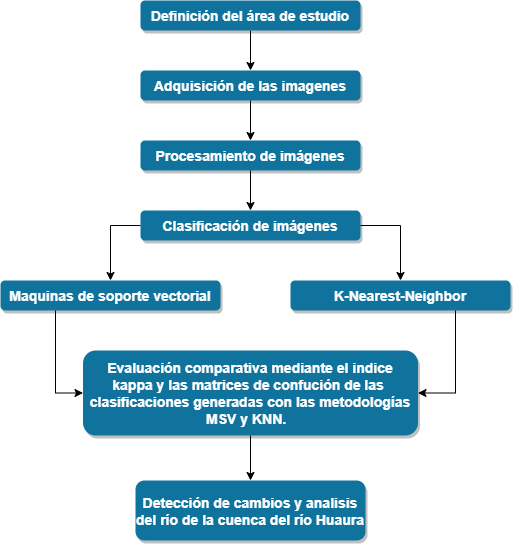


#**ADQUISICIÓN DE IMÁGENES**

---

Descargamos las imágenes con amazón aws.
Link para más referencia: 

Importamos las librerias

In [ ]:
#@title <font color=#FF7F00> Click to run </font>  { display-mode: "form" }

import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
from rasterio.plot import show
from glob import glob
from scipy.io import loadmat
import rasterio as rio

Introducimos la informacion para extraer las imagenes satelitales del 2017 en marzo.


In [ ]:
PATH='008';
ROW='068';
ID='LC08_L1TP_008068_20170415_20170501_01_T1';
Bandas=7;

Cargamos las imágenes de las 7 bandas disponibles

In [ ]:
fpath=[];
for i in range(Bandas):
  i=i+1;
  fpath.append('http://landsat-pds.s3.amazonaws.com/c1/L8/{}/{}/{}/{}_B{}.TIF'.format(PATH,ROW,ID,ID,i))

fpath

['http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20170415_20170501_01_T1/LC08_L1TP_008068_20170415_20170501_01_T1_B1.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20170415_20170501_01_T1/LC08_L1TP_008068_20170415_20170501_01_T1_B2.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20170415_20170501_01_T1/LC08_L1TP_008068_20170415_20170501_01_T1_B3.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20170415_20170501_01_T1/LC08_L1TP_008068_20170415_20170501_01_T1_B4.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20170415_20170501_01_T1/LC08_L1TP_008068_20170415_20170501_01_T1_B5.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20170415_20170501_01_T1/LC08_L1TP_008068_20170415_20170501_01_T1_B6.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20170415_20170501_01_T1/LC08_L1TP_008068_20170415_20170501_01_T1_B7.TIF']

In [ ]:
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1))
# Data
arr_st2017 = np.stack(l)

Compocisión RGB de la imagen satelital.

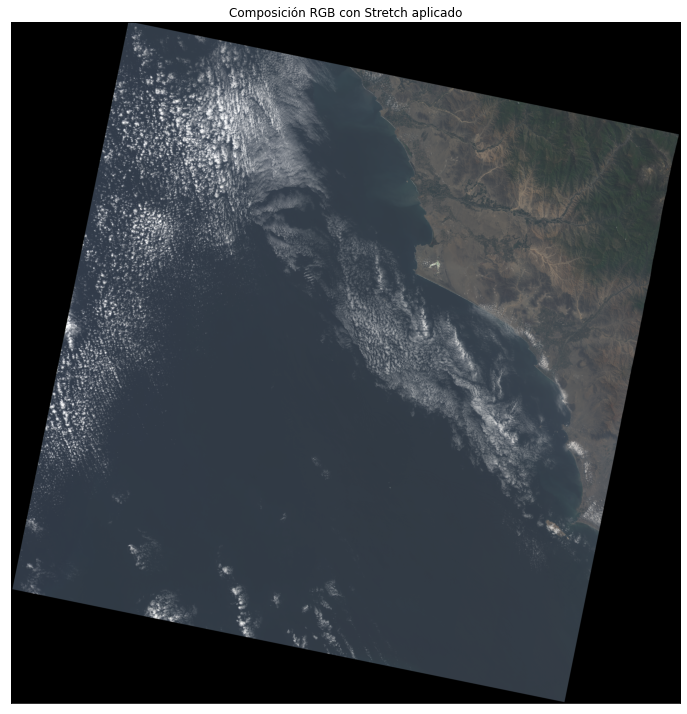

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st2017,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    title="Composición RGB con Stretch aplicado",
)

plt.show()

#**Preprocesamiento**

Eliminamos el fondo negro de la imagen

In [ ]:
arr_st17=arr_st2017.astype("f4")  # Cambia el tipo de datos a float32   
arr_st17

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [ ]:
arr_st17[arr_st17==0]=np.nan # Cambia los valores de cero a nan(No es un numero)
arr_st17

array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan

Graficamos la imagen sin fondo negro

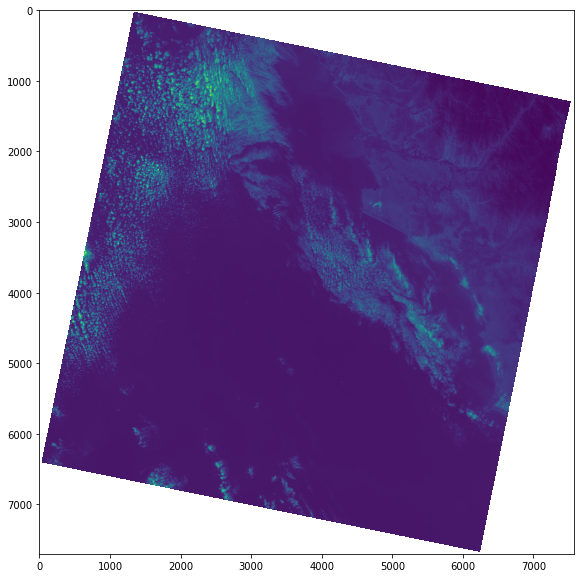

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10)) #Ahora la imagenes ya no sale el fonde negro consecuencia del paso anterior.
show(arr_st17[1], ax=ax)
plt.show() 

Graficamos la imagen RBG

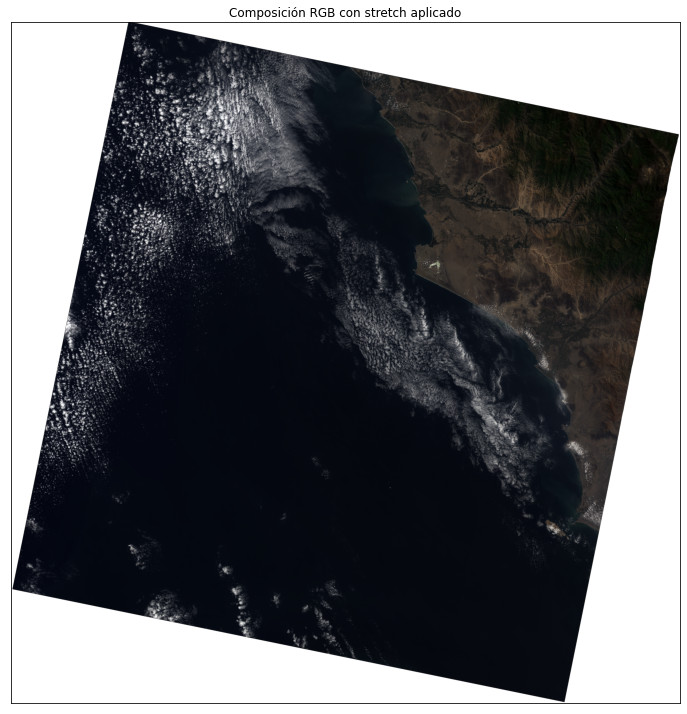

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st17,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    title="Composición RGB con stretch aplicado",
)
plt.show()

Cortamos la imagen

In [ ]:
window= rio.windows.Window(4558,1720,507,410) #(X_inicial,Y_inicial,Ancho,Largo) todo en pixel
window

Window(col_off=4558, row_off=1720, width=507, height=410)

In [ ]:
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1,window=window)) #Se pone cada matriz de banda en un solo vector
# Data
arr_st17 = np.stack(l) 

Graficamos el recorte de la imagen

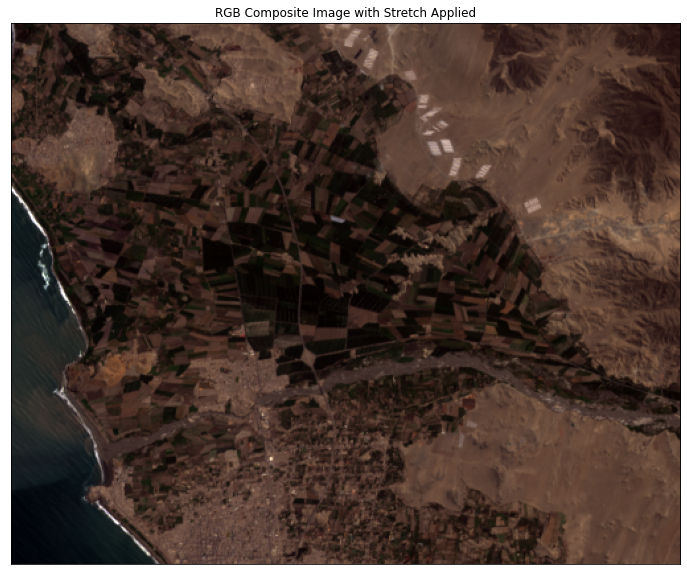

In [ ]:
ep.plot_rgb(
    arr_st17,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    title="RGB Composite Image with Stretch Applied",
)

plt.show()

#**Cargamos la matriz de clases**

In [ ]:
y1_data=loadmat('/matriz_pesos.mat')['c']   #Se asigna el valor de la matriz a una variable... [KEY](es el nombre de la matriz en el matlab)
y1_data

array([[5, 1, 2, ..., 4, 4, 4],
       [5, 1, 2, ..., 4, 4, 4],
       [5, 1, 2, ..., 4, 4, 4],
       ...,
       [5, 5, 5, ..., 4, 4, 4],
       [5, 5, 5, ..., 4, 4, 4],
       [5, 5, 5, ..., 4, 4, 4]], dtype=uint8)

Graficamos la imagen cargada

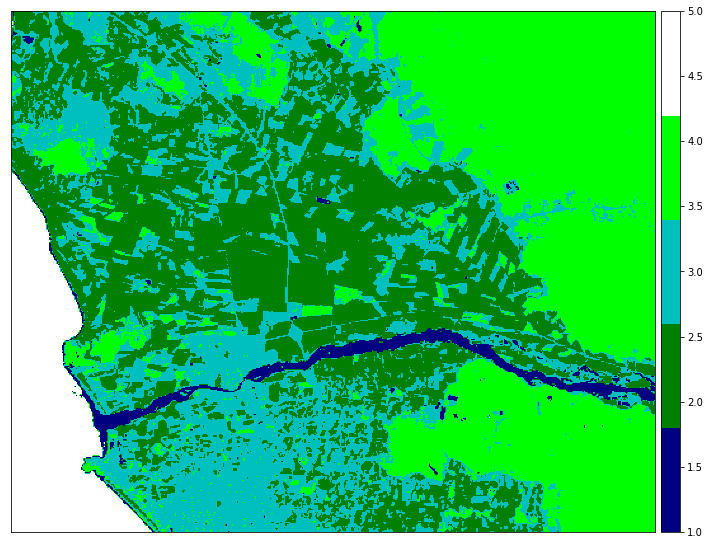

In [ ]:
from matplotlib.colors import ListedColormap
# Visualizar la matriz de clases

ep.plot_bands(y1_data, 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w']))
plt.show()

Graficamos las 7 bandas



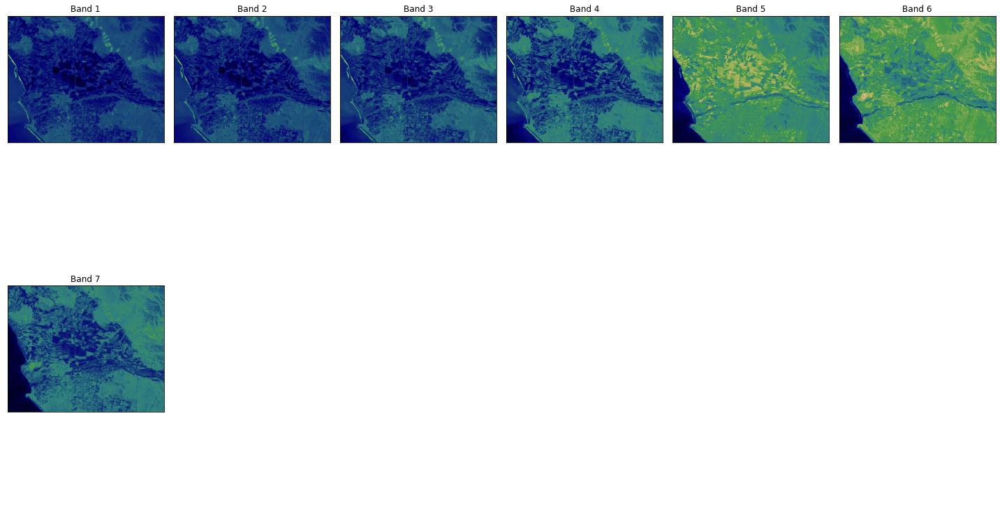

In [ ]:
ep.plot_bands(arr_st17, 
              cmap = 'gist_earth', 
              figsize = (20, 12), 
              cols = 6, 
              cbar = False)
plt.show() #Verificamos que las bandas esten en arr_st17

# **Clasificación con el KNN**

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

x = np.moveaxis(arr_st17, 0, -1)

X_data = x.reshape(-1, 7)
scaler = StandardScaler().fit(X_data)
X_scaled = scaler.transform(X_data) #Antes del entrenamiento debemos de vectorizar cada banda y ponerlo en una matriz de 7 filas.

# Split data 
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y1_data.ravel(), 
                                                    test_size=0.3, stratify = y1_data.ravel()) #Dividimos en dos cuerpos los vectores de las bandas y la matriz de clases. 
print(f"Dimension X_train : {X_train.shape}\nDimension X_test : {X_test.shape}\nDimension y_train: {y_train.shape}\nDimension y_test:{y_test.shape}")
#Una parte para entrenamiento y otra para hacer pruebas.
#y1_data.ravel() vectorizar la matriz de clases.

Dimension X_train : (145509, 7)
Dimension X_test : (62361, 7)
Dimension y_train: (145509,)
Dimension y_test:(62361,)


Importamos las librerias

In [ ]:
import sys
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
#from sklearn import cross_validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold, cross_val_score
from sklearn import datasets
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import seaborn as sns

Realizamos el entrenamiento

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import math
# K-NNC
knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train, y_train) #Se coloca la parte para entrenar de las imagenes y la matriz de clases

# Predecir las clases de los datos de prueba

knn_pred = knn.predict(X_test)



print( f"Accuracy: {accuracy_score(y_test, knn_pred)*100}")
print( classification_report(y_test, knn_pred))

Accuracy: 87.80006734978592
              precision    recall  f1-score   support

           1       0.85      0.81      0.83      1383
           2       0.86      0.88      0.87     19508
           3       0.79      0.79      0.79     17450
           4       0.95      0.93      0.94     19627
           5       0.99      0.99      0.99      4393

    accuracy                           0.88     62361
   macro avg       0.89      0.88      0.89     62361
weighted avg       0.88      0.88      0.88     62361



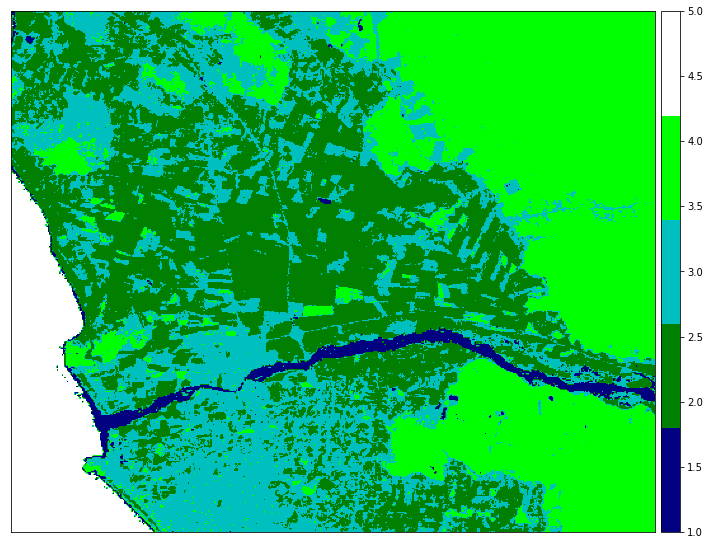

In [ ]:
ep.plot_bands(knn.predict(X_scaled).reshape((410,507)), 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w']))
plt.show()

#**Clasificación con Super Vector Machines**

In [ ]:
from sklearn.svm import SVC

svm = SVC(C=3.0, kernel='rbf', degree=6, cache_size=1024)

# Entrenamiento
svm.fit(X_train, y_train)

# Predecir las clases de los datos de prueba
svm_pred = svm.predict(X_test)

# Accuracy and Classification Reeport
print(f"Accuracy: {accuracy_score(y_test, svm_pred)*100}")
print(classification_report(y_test, svm_pred))

NameError: ignored

macro avg

weight avg

**Graficamos para observar la clasificación**

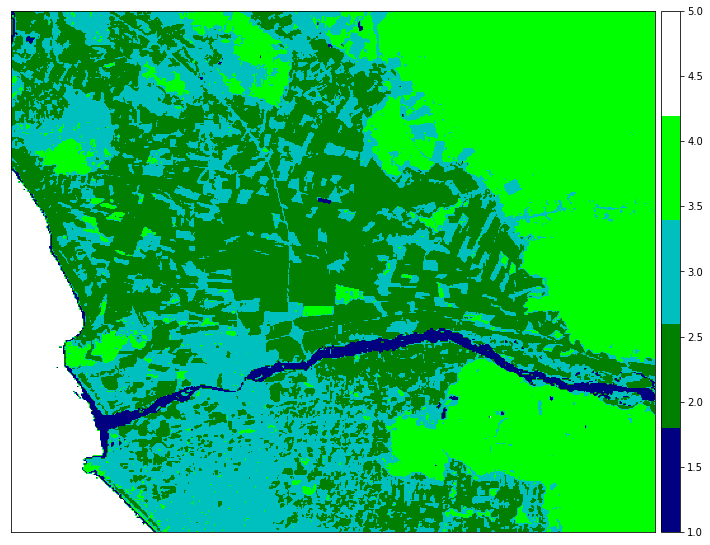

In [ ]:
ep.plot_bands(svm.predict(X_scaled).reshape((410,507)), 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w']))
plt.show()

# **RESULTADOS**

**Matriz de confusión para el K-N-N**

Importamos las librerias para la matriz de confusión.

In [ ]:
from sklearn.metrics import confusion_matrix
from string import ascii_uppercase
import pandas as pd
import seaborn as sns
import numpy as np

In [ ]:
  x = np.moveaxis(arr_st17, 0, -1)
  X_data = x.reshape(-1, 7)
  scaler = StandardScaler().fit(X_data)
  VectordeMatizdeCon = scaler.transform(X_data)

In [ ]:
Y_Predic=knn.predict(X_scaled)

In [ ]:
Y_verd=y1_data.ravel() # .ravel para transformar a vector

.shape, para ver la cantidad de pixeles

In [ ]:
Y_Predic.shape

(207870,)

In [ ]:
Y_verd.shape

(207870,)

In [ ]:
Clases=['Rio','Veget','Ciudad','TieDes','Mar']

<function matplotlib.pyplot.show>

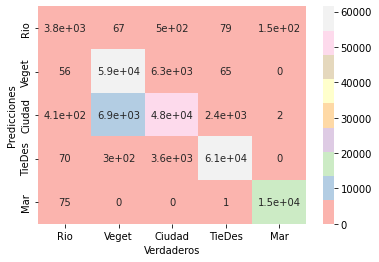

In [ ]:
confm=confusion_matrix(Y_verd,Y_Predic)
columnas=['%s'%(i) for i in Clases]
df_cm=pd.DataFrame(confm,index=columnas,columns=columnas)

MC=sns.heatmap(df_cm,cmap='Pastel1',annot=True)
plt.ylabel('Valores verdaderos')
plt.xlabel('Predicciones')
MC.set(xlabel='Verdaderos',ylabel='Predicciones')
plt.show

**Matriz de Confusión SMV**


In [ ]:
  x = np.moveaxis(arr_st17, 0, -1)
  X_data = x.reshape(-1, 7)
  scaler = StandardScaler().fit(X_data)
  VectordeMatizdeCon = scaler.transform(X_data)

In [ ]:
Y_Predic=svm.predict(X_scaled)

In [ ]:
Y_verd=y1_data.ravel()

In [ ]:
Y_Predic.shape

(207870,)

In [ ]:
Y_verd.shape

(207870,)

In [ ]:
Clases=['Rio','Veget','Ciudad','TieDes','Mar']

<function matplotlib.pyplot.show>

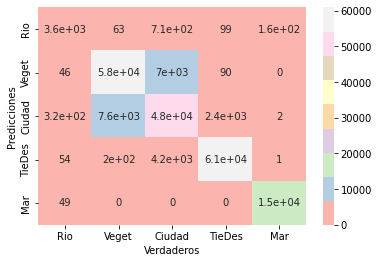

In [ ]:
confm=confusion_matrix(Y_verd,Y_Predic)
columnas=['%s'%(i) for i in Clases]
df_cm=pd.DataFrame(confm,index=columnas,columns=columnas)

MC=sns.heatmap(df_cm,cmap='Pastel1',annot=True)
plt.ylabel('Valores verdaderos')
plt.xlabel('Predicciones')
MC.set(xlabel='Verdaderos',ylabel='Predicciones')
plt.show


# **Imagen satelital 2016**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
from rasterio.plot import show

In [ ]:
PATH='008';
ROW='068';
ID='LC08_L1TP_008068_20161224_20170315_01_T1';
Bandas=7;

from glob import glob
import numpy as np
from scipy.io import loadmat
import rasterio as rio

#Cargando las imagenes de las 7 bandas disponibles.
fpath=[];
for i in range(Bandas):
  i=i+1;
  fpath.append('http://landsat-pds.s3.amazonaws.com/c1/L8/{}/{}/{}/{}_B{}.TIF'.format(PATH,ROW,ID,ID,i))

In [ ]:
fpath

['http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20161224_20170315_01_T1/LC08_L1TP_008068_20161224_20170315_01_T1_B1.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20161224_20170315_01_T1/LC08_L1TP_008068_20161224_20170315_01_T1_B2.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20161224_20170315_01_T1/LC08_L1TP_008068_20161224_20170315_01_T1_B3.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20161224_20170315_01_T1/LC08_L1TP_008068_20161224_20170315_01_T1_B4.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20161224_20170315_01_T1/LC08_L1TP_008068_20161224_20170315_01_T1_B5.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20161224_20170315_01_T1/LC08_L1TP_008068_20161224_20170315_01_T1_B6.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20161224_20170315_01_T1/LC08_L1TP_008068_20161224_20170315_01_T1_B7.TIF']

In [ ]:
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1))
# Data
arr_st2016 = np.stack(l)

In [ ]:
arr_st2016

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

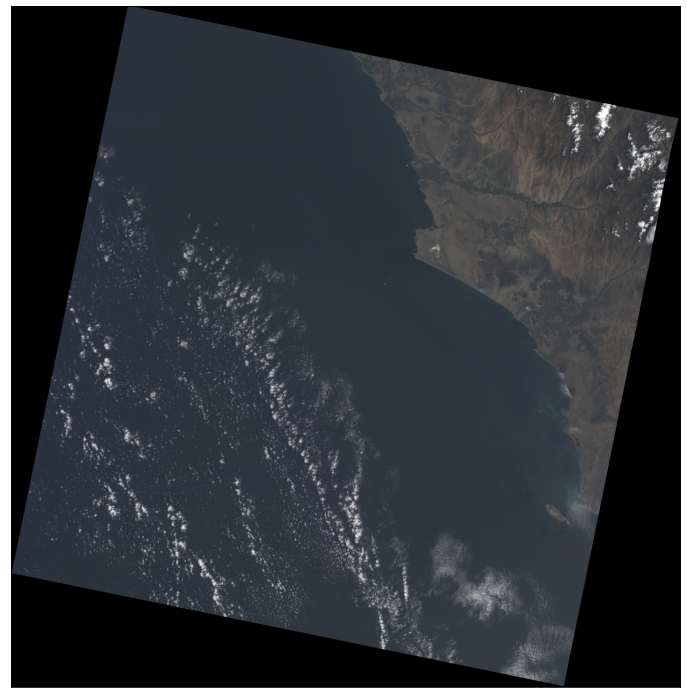

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st2016,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

In [ ]:
arr_st16=arr_st2016.astype("f4")
arr_st16

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [ ]:
arr_st16[arr_st16==0]=np.nan
arr_st16

array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan

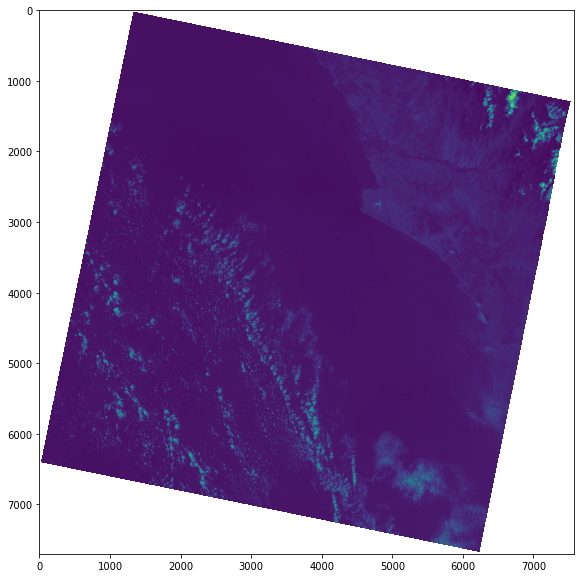

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10))
show(arr_st16[1], ax=ax)
plt.show()

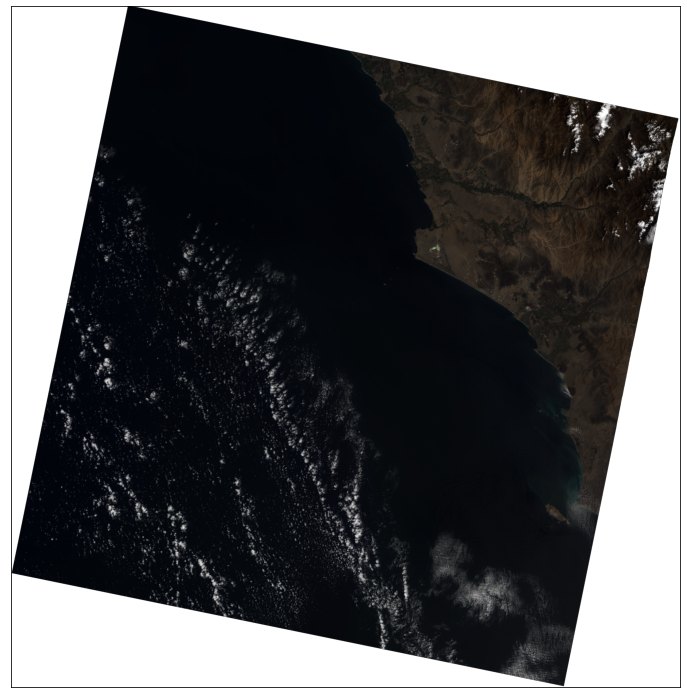

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st16,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)
plt.show()

Recorte de imagen satelital

In [ ]:
window= rio.windows.Window(4509,1720,507,410)
window

Window(col_off=4509, row_off=1720, width=507, height=410)

In [ ]:
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1,window=window))
# Data
arr_st16 = np.stack(l)

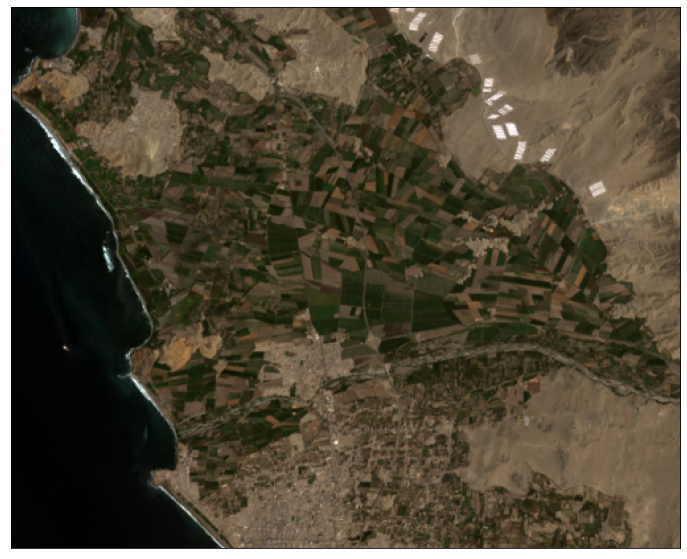

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st16,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

**Clasificación con el KNN**

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

x = np.moveaxis(arr_st16, 0, -1)

X_data = x.reshape(-1, 7)
scaler = StandardScaler().fit(X_data)
X_scaled = scaler.transform(X_data)

In [ ]:
X_scaled.size

1455090

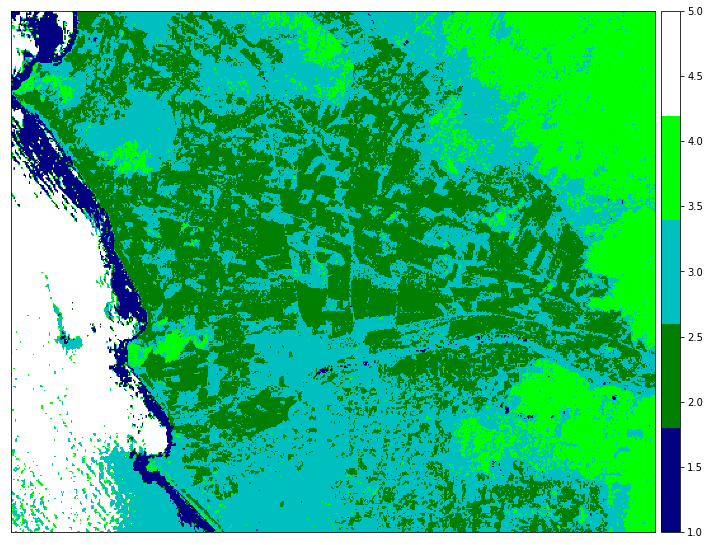

In [ ]:
ep.plot_bands(knn.predict(X_scaled).reshape((410,507)), 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w']))
plt.show()

# **Imagen satelital 2014**


In [ ]:
PATH='008';
ROW='068';
ID='LC08_L1TP_008068_20140423_20170423_01_T1';
Bandas=7;

#Cargando las imagenes de las 7 bandas disponiblesss

fpath=[];
for i in range(Bandas):
  i=i+1;
  fpath.append('http://landsat-pds.s3.amazonaws.com/c1/L8/{}/{}/{}/{}_B{}.TIF'.format(PATH,ROW,ID,ID,i))



In [ ]:
fpath

['http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20140423_20170423_01_T1/LC08_L1TP_008068_20140423_20170423_01_T1_B1.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20140423_20170423_01_T1/LC08_L1TP_008068_20140423_20170423_01_T1_B2.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20140423_20170423_01_T1/LC08_L1TP_008068_20140423_20170423_01_T1_B3.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20140423_20170423_01_T1/LC08_L1TP_008068_20140423_20170423_01_T1_B4.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20140423_20170423_01_T1/LC08_L1TP_008068_20140423_20170423_01_T1_B5.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20140423_20170423_01_T1/LC08_L1TP_008068_20140423_20170423_01_T1_B6.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/008/068/LC08_L1TP_008068_20140423_20170423_01_T1/LC08_L1TP_008068_20140423_20170423_01_T1_B7.TIF']

In [ ]:
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1))
# Data
arr_st2014 = np.stack(l)

In [ ]:
arr_st2014

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [ ]:
arr_st14=arr_st2014.astype("f4")
arr_st14

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

**Quitamos el fondo negro**

In [ ]:
arr_st14[arr_st14==0]=np.nan
arr_st14

array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan

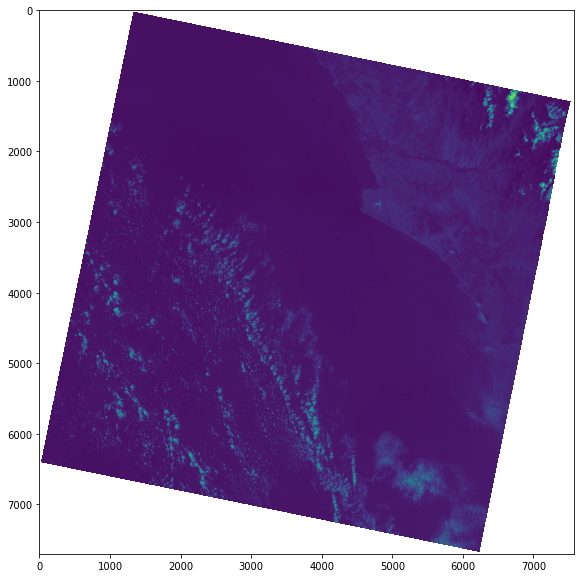

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10))
show(arr_st14[1], ax=ax)
plt.show()

In [ ]:
ep.plot_rgb(
    arr_st14,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

In [ ]:
window= rio.windows.Window(4509,1720,507,410)
window


Window(col_off=4509, row_off=1720, width=507, height=410)

In [ ]:
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1,window=window))
# Data
arr_st14 = np.stack(l)

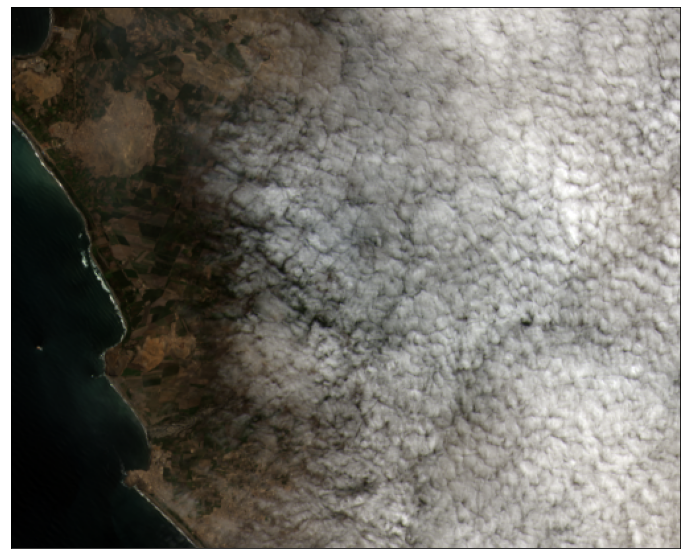

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st14,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

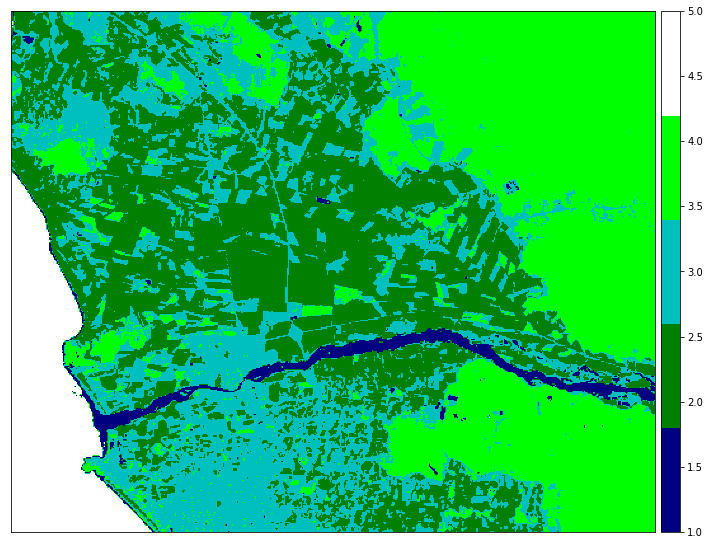

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
# Visualize Groundtruth

ep.plot_bands(y1_data, 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w']))
plt.show()

In [ ]:
x = np.moveaxis(arr_st14, 0, -1)

X_data = x.reshape(-1, 7)
scaler = StandardScaler().fit(X_data)
X_scaled = scaler.transform(X_data)

#**Imagen 2019**




In [ ]:
import sys
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
#from sklearn import cross_validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold, cross_val_score
from sklearn import datasets
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
from rasterio.plot import show

In [ ]:
PATH='006';
ROW='066';
ID='LC08_L1TP_006066_20190728_20190801_01_T1';
Bandas=7;

from glob import glob
import numpy as np
from scipy.io import loadmat
import rasterio as rio

#Cargando las imagenes de las 12 bandas disponiblesss
#S_sentinel_bands = glob("/content/sample_data/*B?*.tiff")
#S_sentinel_bands.sort()
fpath=[];
for i in range(Bandas):
  i=i+1;
  fpath.append('http://landsat-pds.s3.amazonaws.com/c1/L8/{}/{}/{}/{}_B{}.TIF'.format(PATH,ROW,ID,ID,i))



In [ ]:
fpath

['http://landsat-pds.s3.amazonaws.com/c1/L8/006/066/LC08_L1TP_006066_20190728_20190801_01_T1/LC08_L1TP_006066_20190728_20190801_01_T1_B1.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/006/066/LC08_L1TP_006066_20190728_20190801_01_T1/LC08_L1TP_006066_20190728_20190801_01_T1_B2.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/006/066/LC08_L1TP_006066_20190728_20190801_01_T1/LC08_L1TP_006066_20190728_20190801_01_T1_B3.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/006/066/LC08_L1TP_006066_20190728_20190801_01_T1/LC08_L1TP_006066_20190728_20190801_01_T1_B4.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/006/066/LC08_L1TP_006066_20190728_20190801_01_T1/LC08_L1TP_006066_20190728_20190801_01_T1_B5.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/006/066/LC08_L1TP_006066_20190728_20190801_01_T1/LC08_L1TP_006066_20190728_20190801_01_T1_B6.TIF',
 'http://landsat-pds.s3.amazonaws.com/c1/L8/006/066/LC08_L1TP_006066_20190728_20190801_01_T1/LC08_L1TP_006066_20190728_20190801_01_T1_B7.TIF']

In [ ]:
  
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1))
# Data
arr_st = np.stack(l)

In [ ]:
arr_st

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

# **IMAGEN DE PUCALLPA**

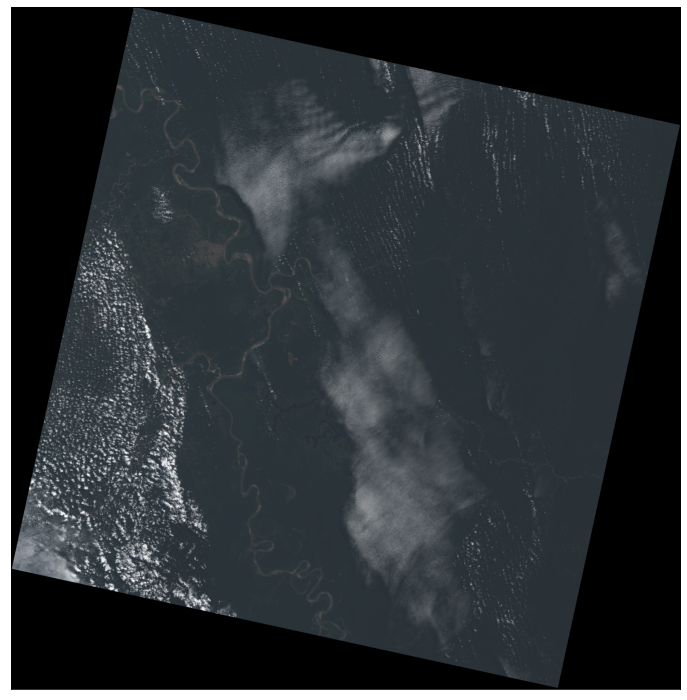

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

In [ ]:
arr_st1=arr_st.astype("f4")
arr_st1

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [ ]:
arr_st1[arr_st1==0]=np.nan
arr_st1

array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan

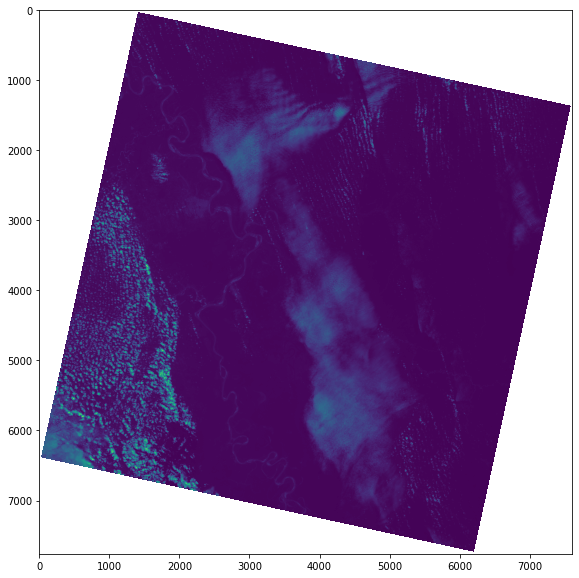

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10))
show(arr_st1[1], ax=ax)
plt.show()

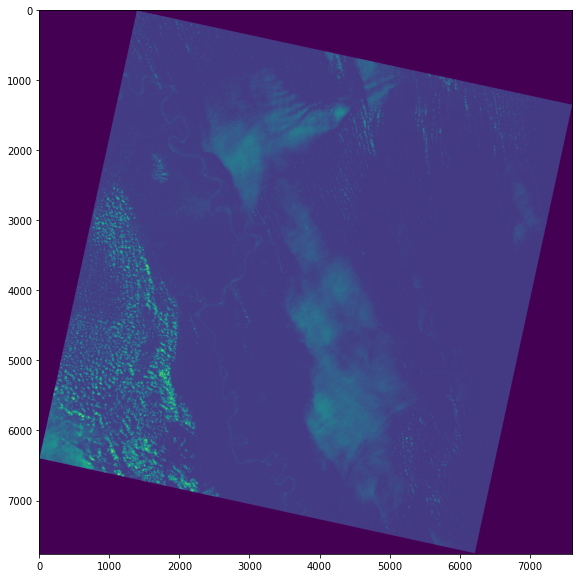

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 10))
show(arr_st[1], ax=ax)
plt.show()

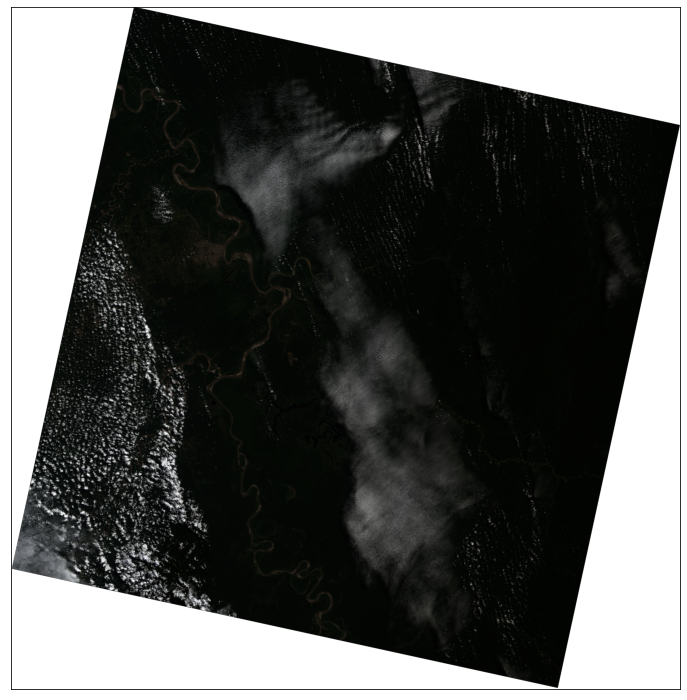

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st1,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

In [ ]:
window= rio.windows.Window(1400,2300,1500,1500)
window

Window(col_off=1400, row_off=2300, width=1500, height=1500)

In [ ]:
l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1,window=window))
# Data
arr_st2 = np.stack(l)

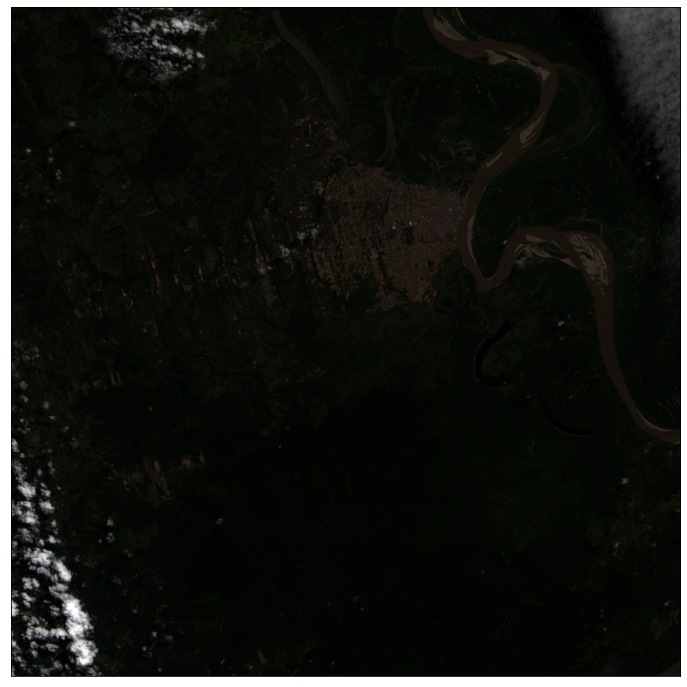

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st2,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

In [ ]:
y1_data=loadmat('/content/PCL-BASE.mat')['C']
y1_data

array([[2, 2, 2, ..., 5, 5, 5],
       [2, 2, 2, ..., 5, 5, 5],
       [2, 2, 2, ..., 5, 5, 5],
       ...,
       [5, 5, 5, ..., 1, 1, 1],
       [5, 5, 5, ..., 1, 1, 3],
       [5, 5, 5, ..., 1, 3, 7]], dtype=uint8)

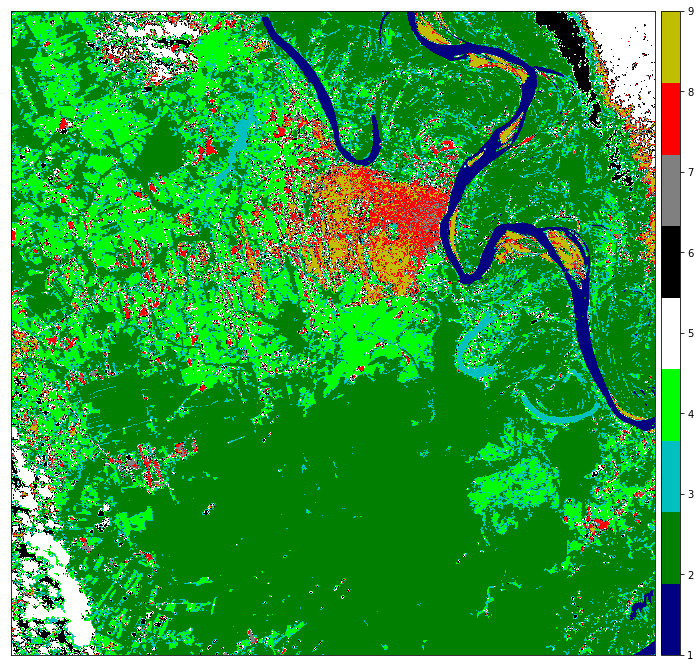

In [ ]:
import earthpy.plot as ep
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
# Visualize Groundtruth

ep.plot_bands(y1_data, 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w','k',
                                   'grey', 'r', 'y']))
plt.show()

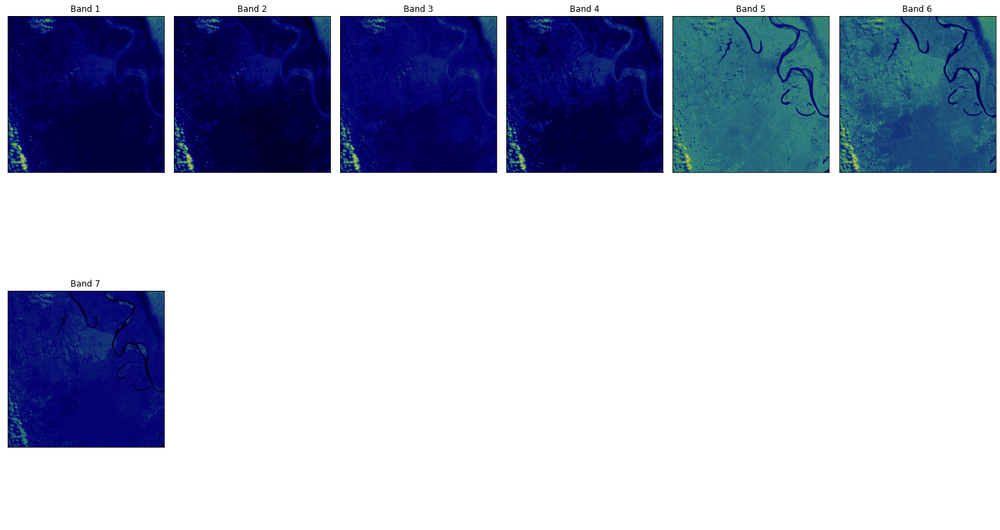

In [ ]:
ep.plot_bands(arr_st2, 
              cmap = 'gist_earth', 
              figsize = (20, 12), 
              cols = 6, 
              cbar = False)
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

x = np.moveaxis(arr_st2, 0, -1)

X_data = x.reshape(-1, 7)
scaler = StandardScaler().fit(X_data)
X_scaled = scaler.transform(X_data)

# Split data 
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y1_data.ravel(), 
                                                    test_size=0.30, stratify = y1_data.ravel())
print(f"X_train Shape: {X_train.shape}\nX_test Shape: {X_test.shape}\ny_train Shape: {y_train.shape}\ny_test Shape:{y_test.shape}")

X_train Shape: (1575000, 7)
X_test Shape: (675000, 7)
y_train Shape: (1575000,)
y_test Shape:(675000,)


In [ ]:
X_scaled

array([[-1.73319962, -1.65684146, -1.23357713, ...,  0.06901483,
        -0.43626325, -0.36564039],
       [-1.75700358, -1.66470959, -1.26283802, ...,  0.33571582,
        -0.44828439, -0.54753276],
       [-1.81056247, -1.73814544, -1.21058644, ...,  0.51679391,
        -0.38773347, -0.55429037],
       ...,
       [ 0.02829286,  0.5934429 ,  1.44797429, ..., -0.77902057,
         0.40165456,  1.05627367],
       [-0.02526604,  0.43083494,  1.36228169, ..., -0.7646818 ,
         0.38161933,  0.98982382],
       [ 0.14136163,  0.58819748,  1.48977556, ..., -0.83760465,
         0.4381632 ,  1.09512993]])

In [ ]:
import sys
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
#from sklearn import cross_validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold, cross_val_score
from sklearn import datasets
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import math
# K-NNC
knn = KNeighborsClassifier(n_neighbors=6)

knn.fit(X_train, y_train)

# Predict the labels of test data

knn_pred = knn.predict(X_test)



print( f"Accuracy: {accuracy_score(y_test, knn_pred)*100}")
print( classification_report(y_test, knn_pred))


Accuracy: 97.75037037037036
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     16461
           2       0.99      1.00      0.99    379350
           3       0.94      0.96      0.95     12825
           4       0.97      0.97      0.97    166731
           5       0.97      0.98      0.98     24192
           6       0.98      0.97      0.97     14371
           7       0.87      0.90      0.88     13475
           8       0.91      0.86      0.88     22891
           9       0.91      0.87      0.89     24704

    accuracy                           0.98    675000
   macro avg       0.95      0.94      0.95    675000
weighted avg       0.98      0.98      0.98    675000



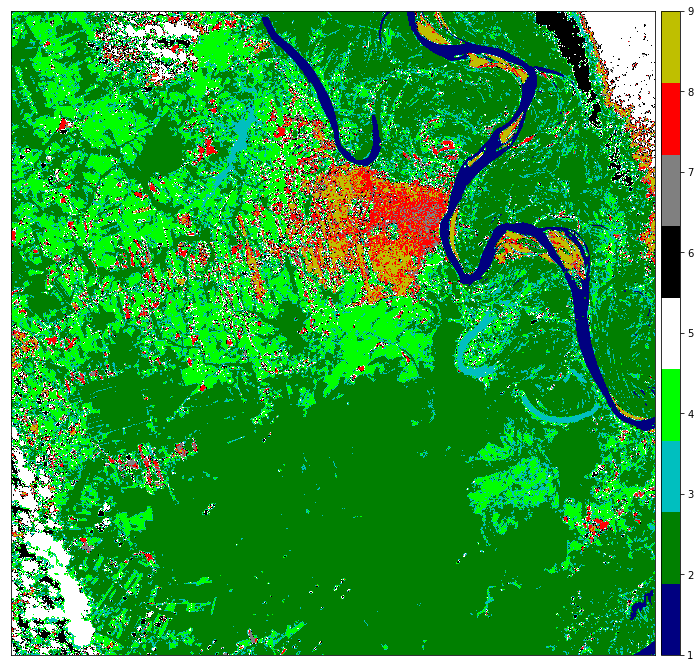

In [ ]:
ep.plot_bands(knn.predict(X_scaled).reshape((1500, 1500)), 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w','k',
                                   'grey', 'r', 'y']))
plt.show()

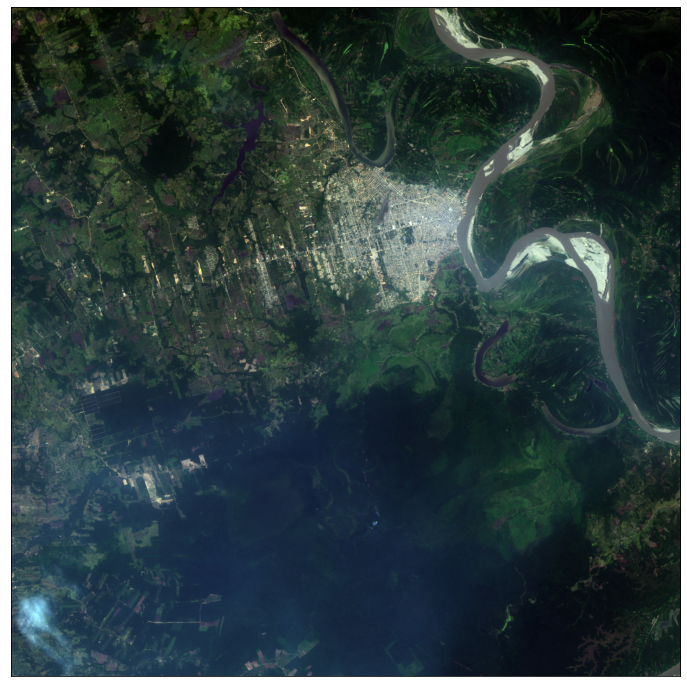

In [ ]:
PATH='006';
ROW='066';
ID='LC08_L1TP_006066_20180911_20180927_01_T1';
Bandas=7;

fpath=[];
for i in range(Bandas):
  i=i+1;
  fpath.append('http://landsat-pds.s3.amazonaws.com/c1/L8/{}/{}/{}/{}_B{}.TIF'.format(PATH,ROW,ID,ID,i))

l = []
for i in fpath:
   with rio.open(i) as f:
    l.append(f.read(1,window=window))
# Data
arr_st3 = np.stack(l)

import earthpy.plot as ep
import matplotlib.pyplot as plt
ep.plot_rgb(
    arr_st3,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

In [ ]:
x = np.moveaxis(arr_st3, 0, -1)

X_data = x.reshape(-1, 7)
scaler = StandardScaler().fit(X_data)
X_scaled = scaler.transform(X_data)

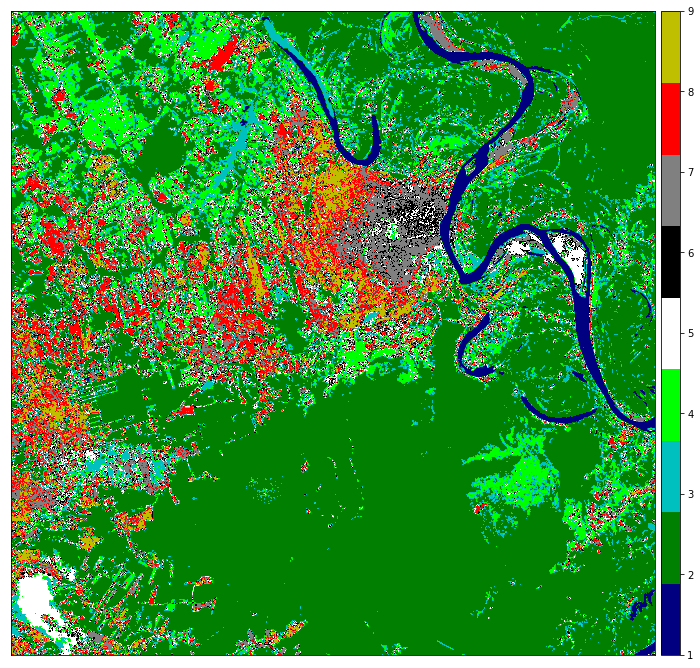

In [ ]:
ep.plot_bands(knn.predict(X_scaled).reshape((1500, 1500)), 
              cmap=ListedColormap(['navy', 'g', 'c','lime','w','k',
                                   'grey', 'r', 'y']))
plt.show()